In [97]:

import os
import json
import warnings

import numpy as np
import iohinspector as ins 

import matplotlib.pyplot as plt
import matplotlib.colors as mcolors
import polars as pl

import matplotlib
matplotlib.rcParams['pdf.fonttype'] = 42
matplotlib.rcParams['ps.fonttype'] = 42
matplotlib.rcParams.update({'font.size': 15})

data = "../../data/"
files = [f for f in os.listdir(data) if 'UNIFORM-' in f and not 'v2' in f]
one_plus_one = [os.path.join(data, f) for f in files if f.startswith("One") and not f.endswith("zip")]
mu_comma = [os.path.join(data, f) for f in files if f.startswith("Mu") and not f.endswith("zip")]
cma_es = [os.path.join(data, f) for f in files if f.startswith("CMA-ES-UN") and not f.endswith("zip")]
cma_es_sob = [os.path.join(data, f) for f in files if f.startswith("CMA-ES-SOB") and not f.endswith("zip")]

len(one_plus_one), len(mu_comma), len(cma_es), 


cma_es_sob = ['../../data/CMA-ES-UNIFORM-SCALED_UNIFORM',
  '../../data/CMA-ES-UNIFORM-GAUSSIAN',] + cma_es_sob


1,2,3,4,5,6,7,8,9,10,11,12,13,14,15,16,17,18,19,20,21,

/tmp/ipykernel_2696152/980935588.py:13: RuntimeWarning: More than 20 figures have been opened. Figures created through the pyplot interface (`matplotlib.pyplot.figure`) are retained until explicitly closed and may consume too much memory. (To control this warning, see the rcParam `figure.max_open_warning`). Consider using `matplotlib.pyplot.close()`.
  f, axes = plt.subplots(1, 5, figsize=(20, 7), sharey=True)


22,23,24,

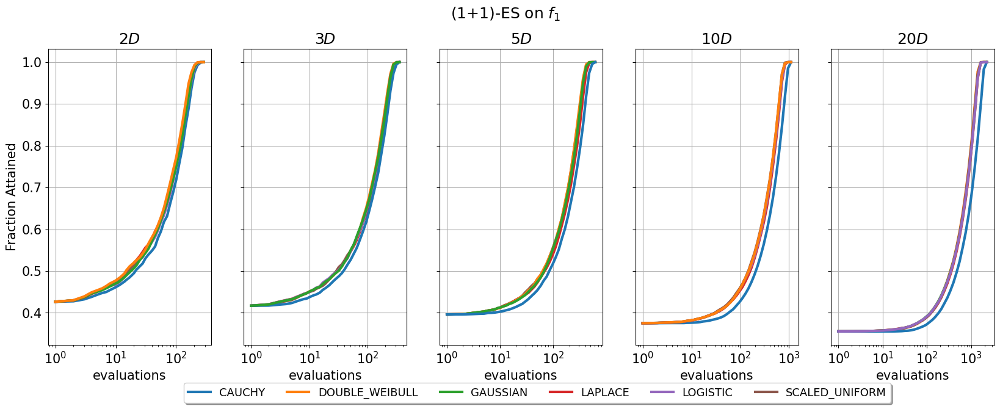

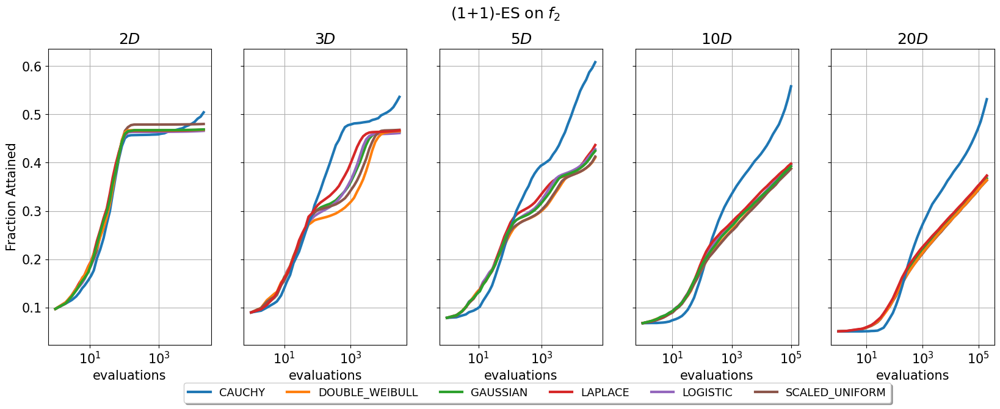

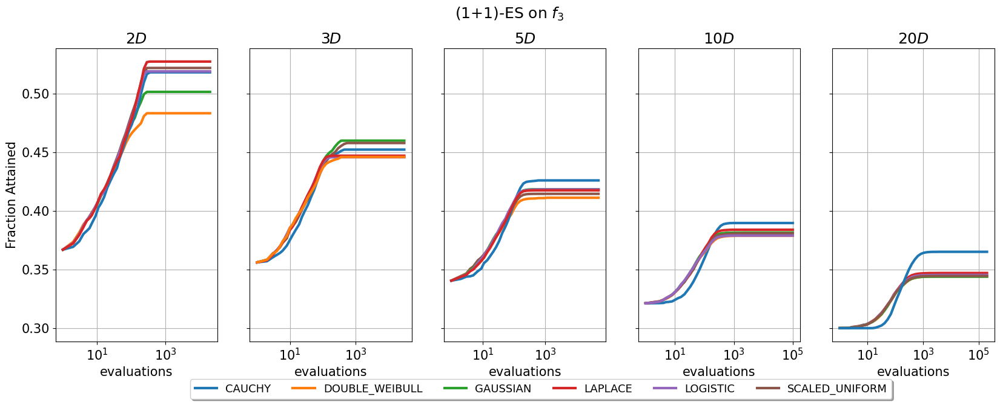

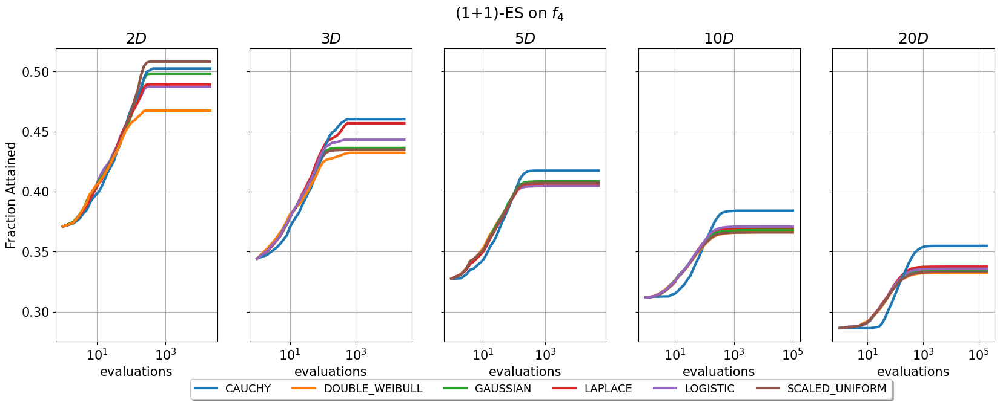

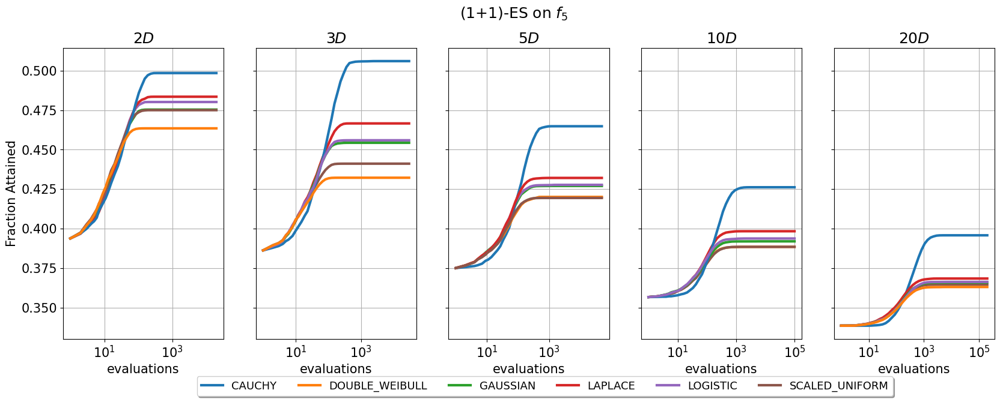

...

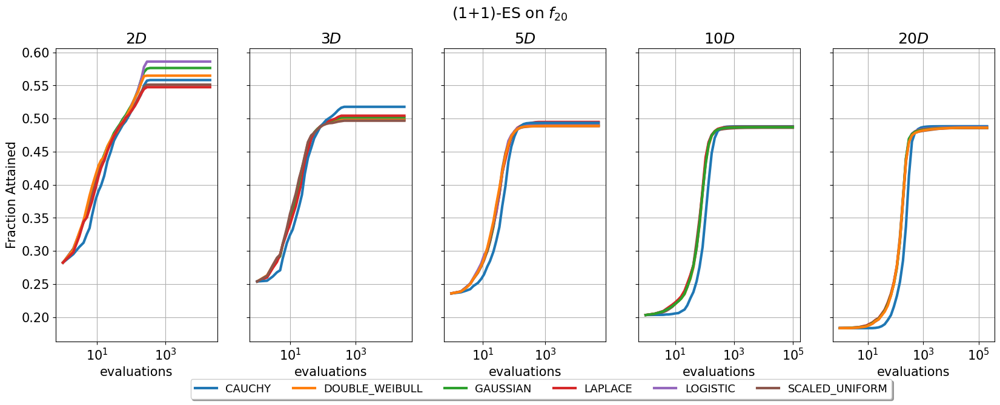

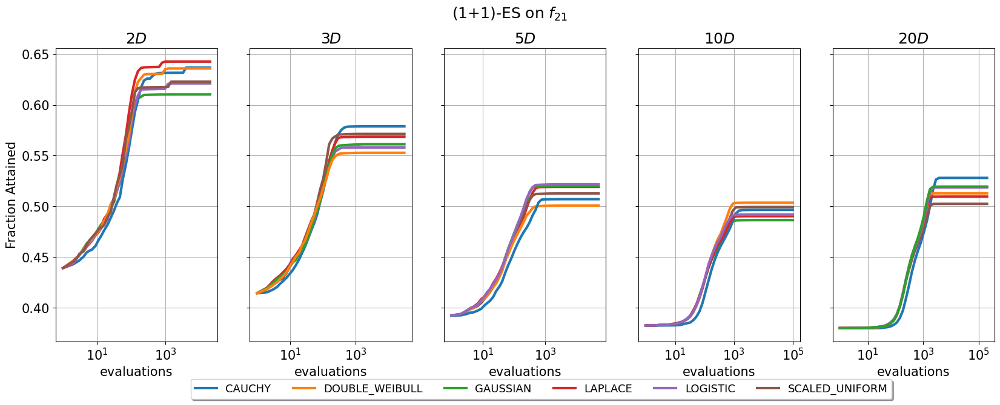

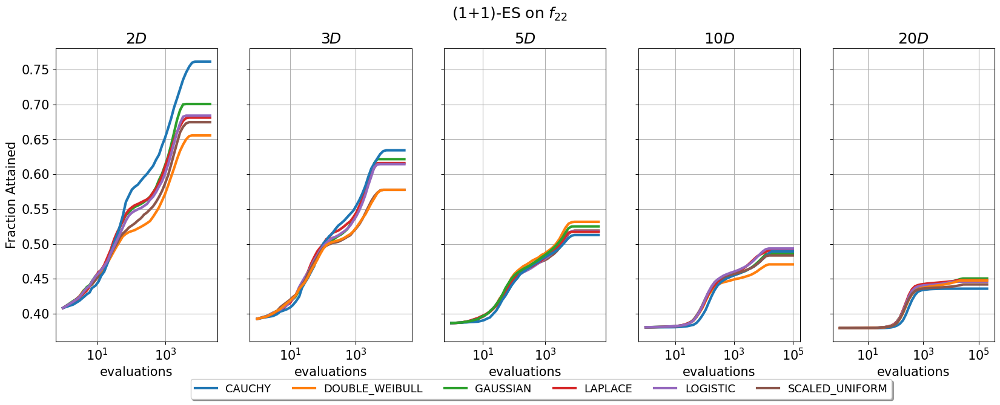

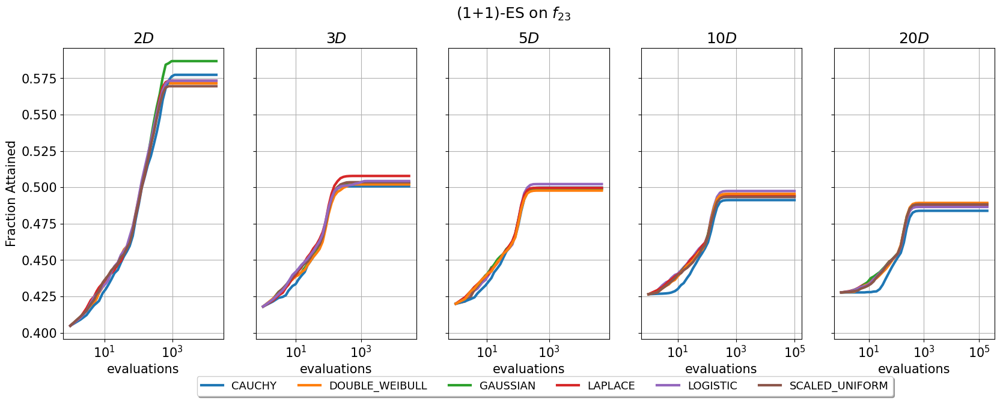

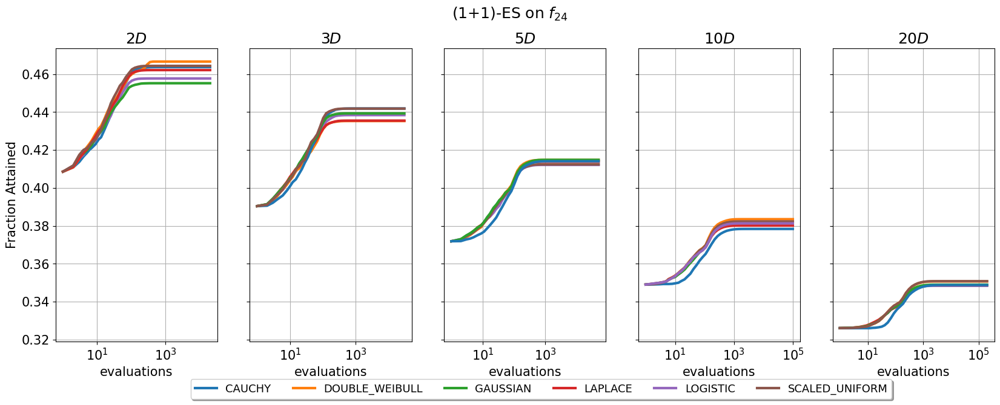

In [2]:
manager = ins.DataManager()

algs = []
for alg in one_plus_one:
    algs.append(os.path.basename(alg))
    manager.add_folder(alg)
    
algs.sort()
colors = dict(zip(algs, mcolors.TABLEAU_COLORS))

for fid in range(1, 25):
    print(fid, end=',')
    f, axes = plt.subplots(1, 5, figsize=(20, 7), sharey=True)

    f.suptitle(f"(1+1)-ES on $f_{{{fid}}}$")
    for dim, ax in zip((2, 3, 5, 10, 20), axes.ravel()):
        with warnings.catch_warnings():
            warnings.simplefilter("ignore")
            m = manager.select(function_ids=[fid], dimensions=[dim])
            
        dt = ins.plot.plot_ecdf(m.load(True, True), ax=ax)
        lines = ax.get_lines()[::]
        for line, line_label in zip(lines[:len(lines)//2], lines[len(lines)//2:]):
            if (lab:=line_label.get_label()) in colors:
                for l in (line, line_label):
                    l.set_color(colors[lab])
                    l.set_linewidth(3)  
                    if lab.endswith("128"):
                        l.set_linestyle('dashed')  
                    else:
                        l.set_linestyle('solid')  
                
        handles, labels = ax.get_legend_handles_labels()
        labels = [l[19:] for l in labels[:]]
        idx = np.argsort(labels)
        ax.set_title(f"${dim}D$")
        ax.set_ylabel("Fraction Attained")
        box = ax.get_position()
        ax.set_position([box.x0, box.y0 + box.height * 0.1,
                 box.width, box.height * 0.9])
        
        if dim == 2:
            ax.legend(np.array(handles)[idx], np.array(labels)[idx], loc='upper center',
                fontsize=13, bbox_to_anchor=(3, -0.11), fancybox=True, shadow=True, ncol=len(labels)              
            )
        else:
            ax.legend().remove()
            
            
    # plt.tight_layout()
    plt.savefig(f"1p1_f{fid}.pdf")

1,2,3,4,5,6,7,8,9,10,11,12,13,14,15,16,17,18,19,20,21,

/tmp/ipykernel_2696152/785175574.py:13: RuntimeWarning: More than 20 figures have been opened. Figures created through the pyplot interface (`matplotlib.pyplot.figure`) are retained until explicitly closed and may consume too much memory. (To control this warning, see the rcParam `figure.max_open_warning`). Consider using `matplotlib.pyplot.close()`.
  f, axes = plt.subplots(1, 5, figsize=(20, 7), sharey=True)


22,23,24,

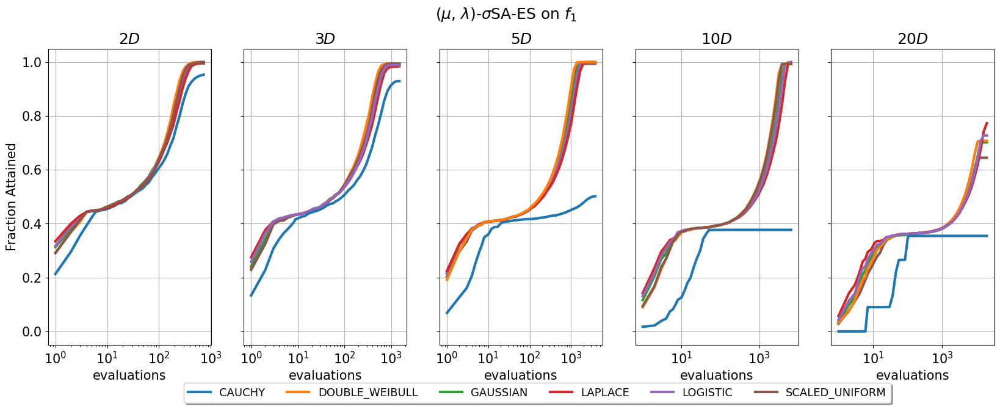

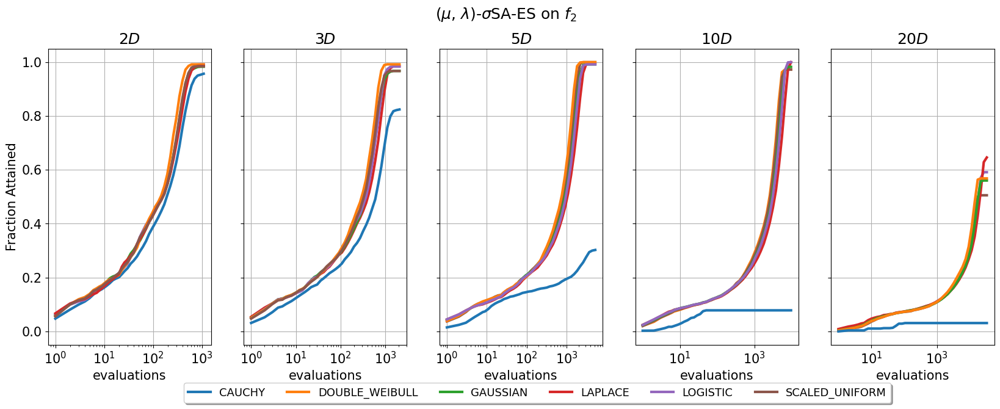

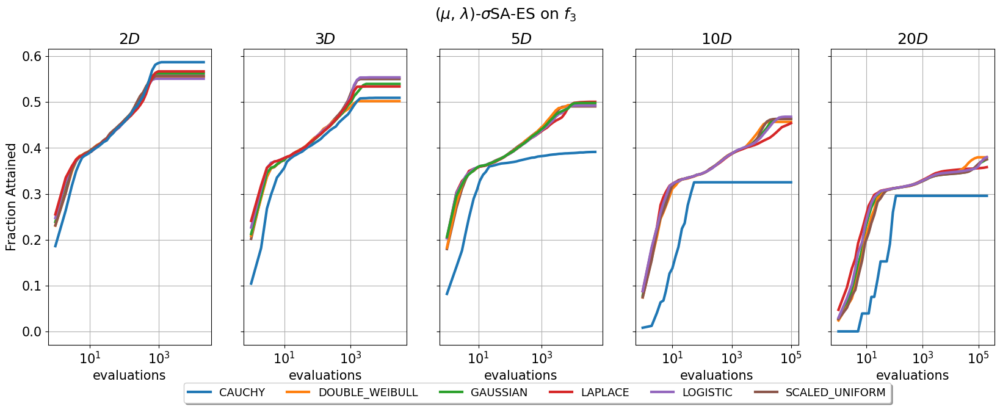

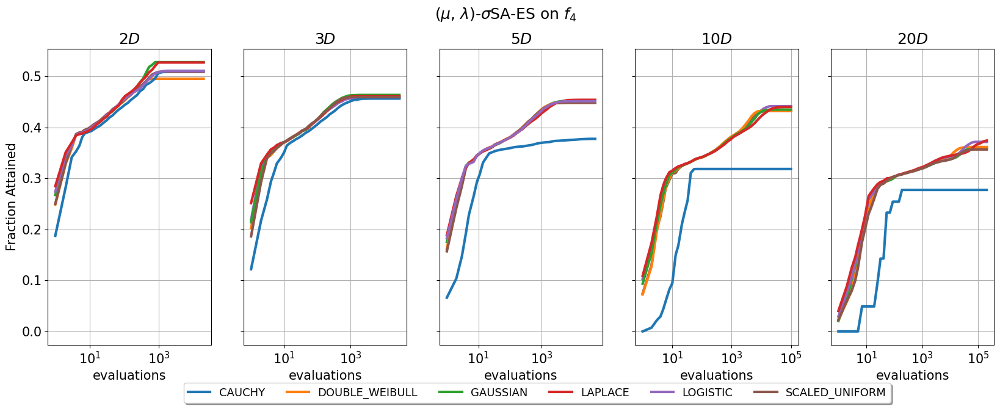

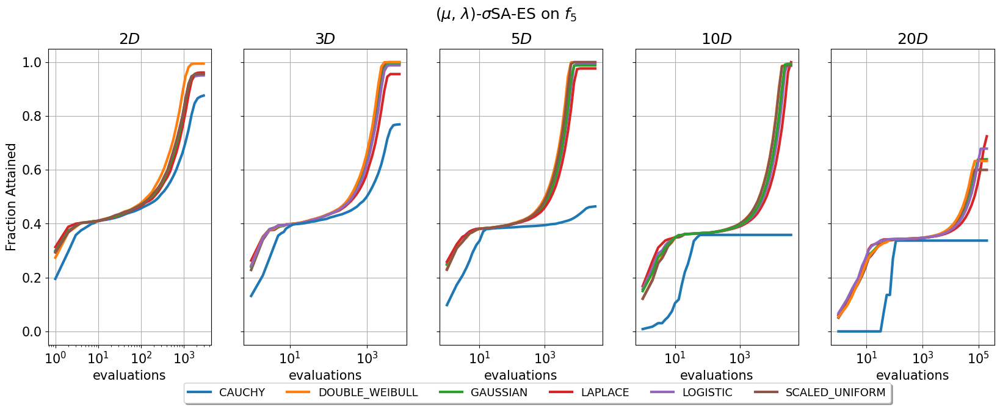

...

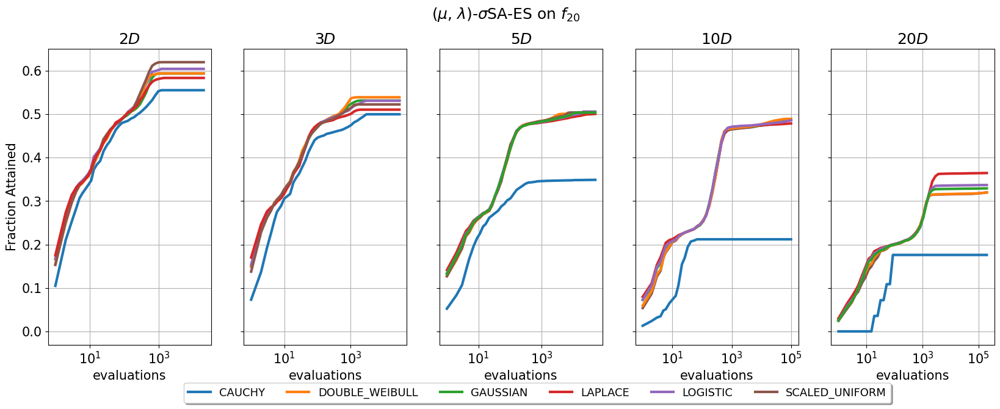

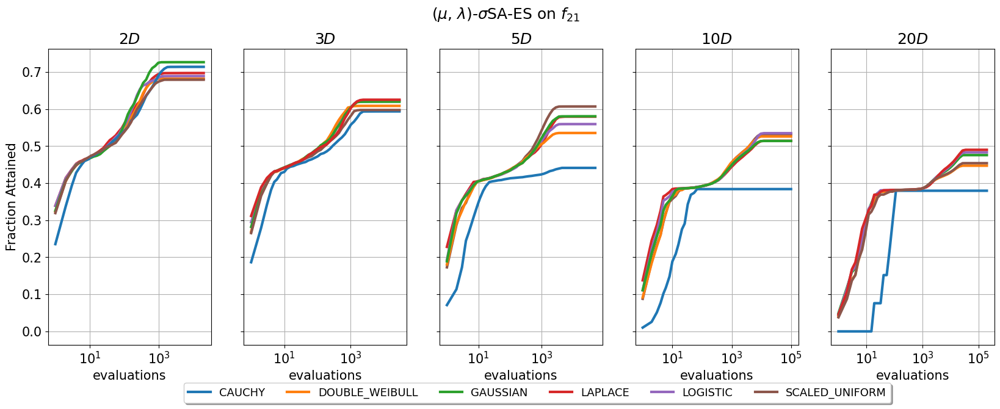

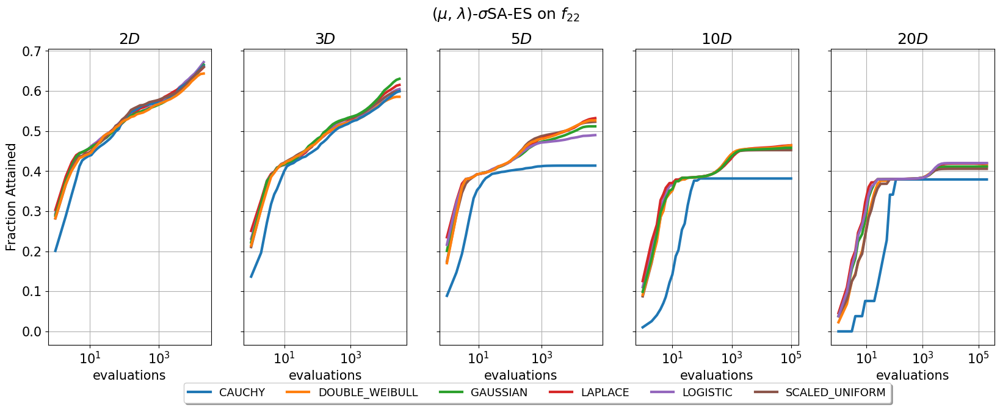

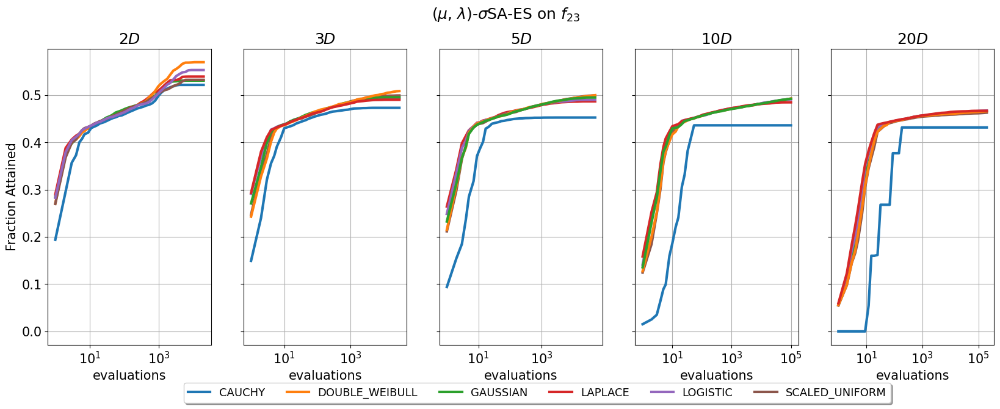

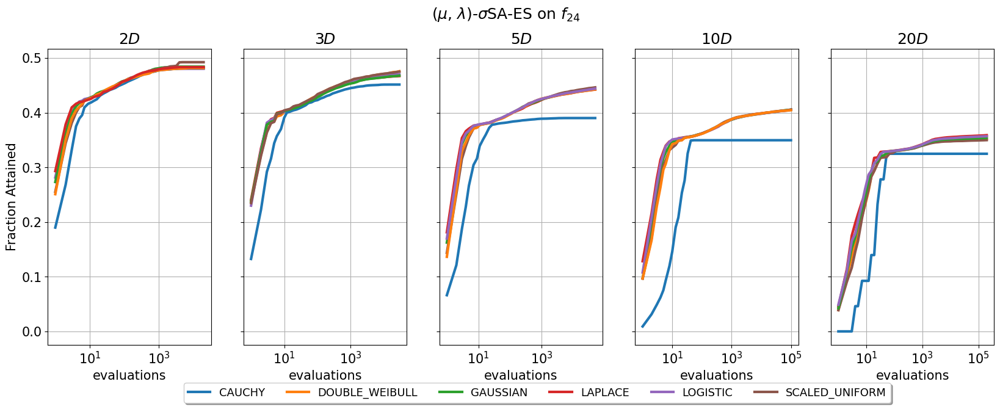

In [3]:
manager = ins.DataManager()

algs = []
for alg in mu_comma:
    algs.append(os.path.basename(alg))
    manager.add_folder(alg)
    
algs.sort()
colors = dict(zip(algs, mcolors.TABLEAU_COLORS))

for fid in range(1, 25):
    print(fid, end=',')
    f, axes = plt.subplots(1, 5, figsize=(20, 7), sharey=True)

    f.suptitle(f"($\mu$, $\lambda$)-$\sigma$SA-ES on $f_{{{fid}}}$")
    for dim, ax in zip((2, 3, 5, 10, 20), axes.ravel()):
        with warnings.catch_warnings():
            warnings.simplefilter("ignore")
            m = manager.select(function_ids=[fid], dimensions=[dim])
            
        dt = ins.plot.plot_ecdf(m.load(True, True), ax=ax)
        lines = ax.get_lines()[::]
        for line, line_label in zip(lines[:len(lines)//2], lines[len(lines)//2:]):
            if (lab:=line_label.get_label()) in colors:
                for l in (line, line_label):
                    l.set_color(colors[lab])
                    l.set_linewidth(3)  
                    if lab.endswith("128"):
                        l.set_linestyle('dashed')  
                    else:
                        l.set_linestyle('solid')  
                
        handles, labels = ax.get_legend_handles_labels()
        labels = [l[22:] for l in labels[:]]
        idx = np.argsort(labels)
        ax.set_title(f"${dim}D$")
        ax.set_ylabel("Fraction Attained")
        
        box = ax.get_position()
        ax.set_position([box.x0, box.y0 + box.height * 0.1,
                 box.width, box.height * 0.9])
        
        if dim == 2:
            ax.legend(np.array(handles)[idx], np.array(labels)[idx], loc='upper center',
                fontsize=13, bbox_to_anchor=(3, -0.11), fancybox=True, shadow=True, ncol=len(labels)              
            )
        else:
            ax.legend().remove()
    # plt.tight_layout()
    plt.savefig(f"mu_comma_f{fid}.pdf")

1,2,3,4,5,6,7,8,9,10,11,12,13,14,15,16,17,18,19,20,21,

/tmp/ipykernel_2696152/470488661.py:13: RuntimeWarning: More than 20 figures have been opened. Figures created through the pyplot interface (`matplotlib.pyplot.figure`) are retained until explicitly closed and may consume too much memory. (To control this warning, see the rcParam `figure.max_open_warning`). Consider using `matplotlib.pyplot.close()`.
  f, axes = plt.subplots(1, 5, figsize=(20, 7), sharey=True)


22,23,24,

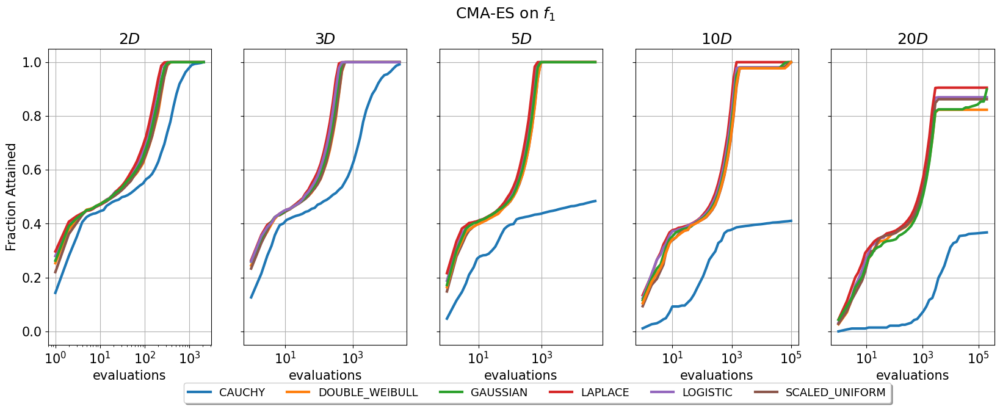

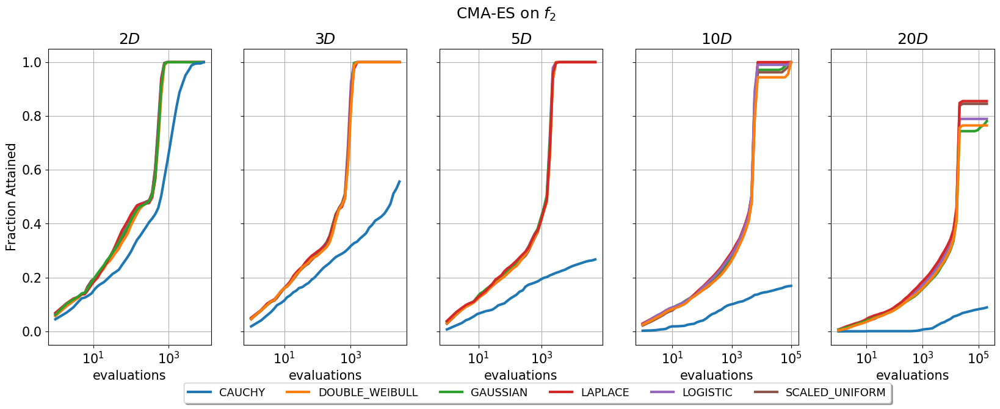

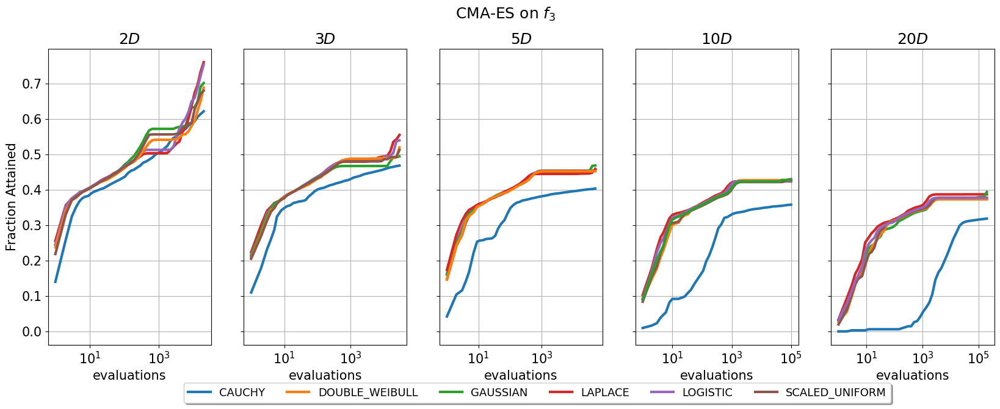

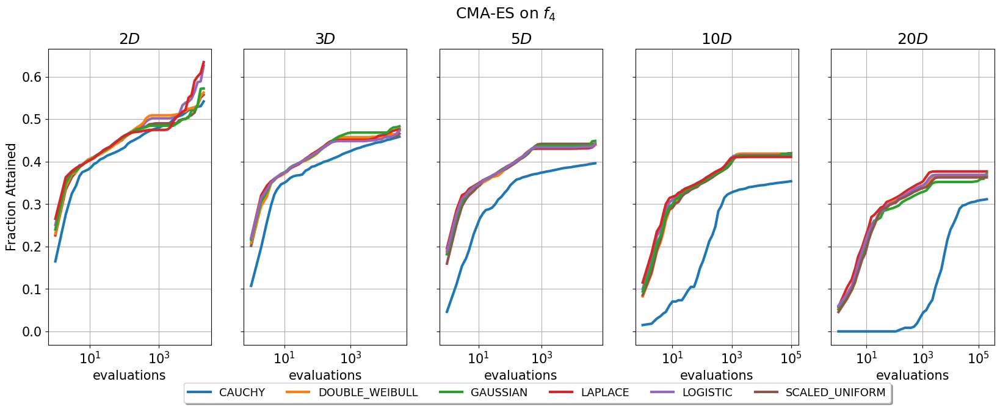

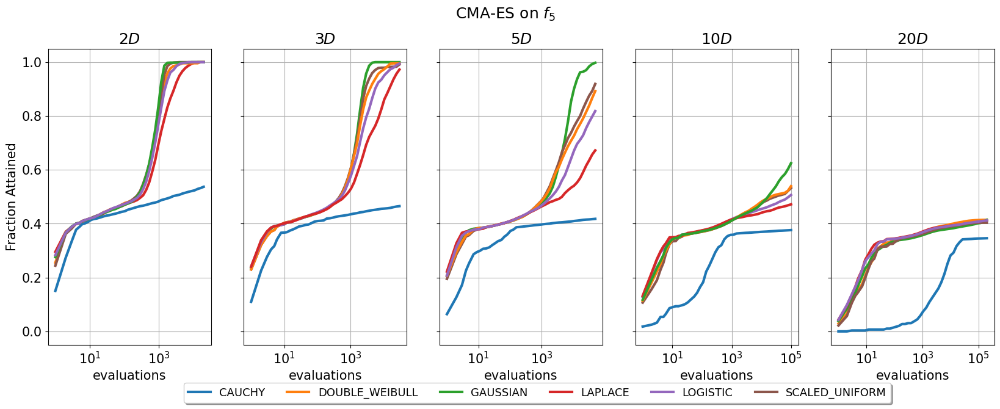

...

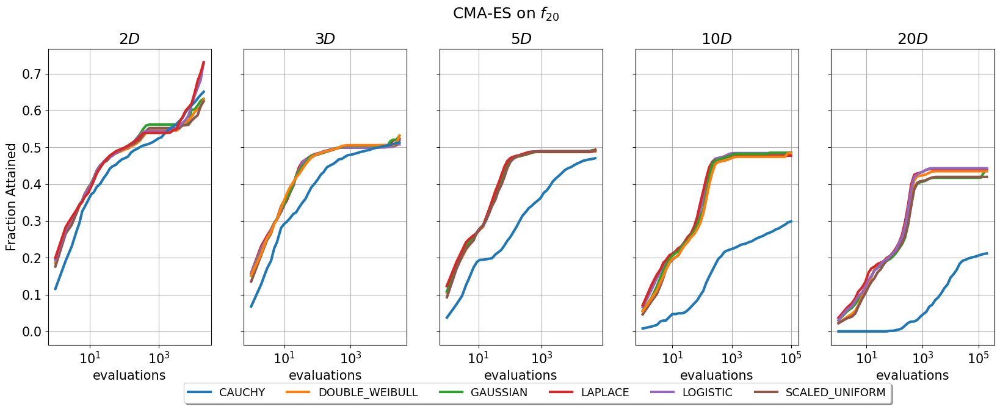

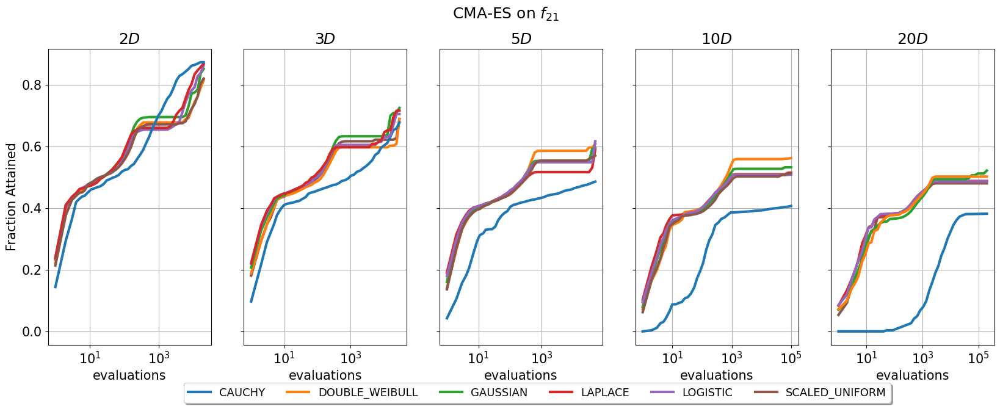

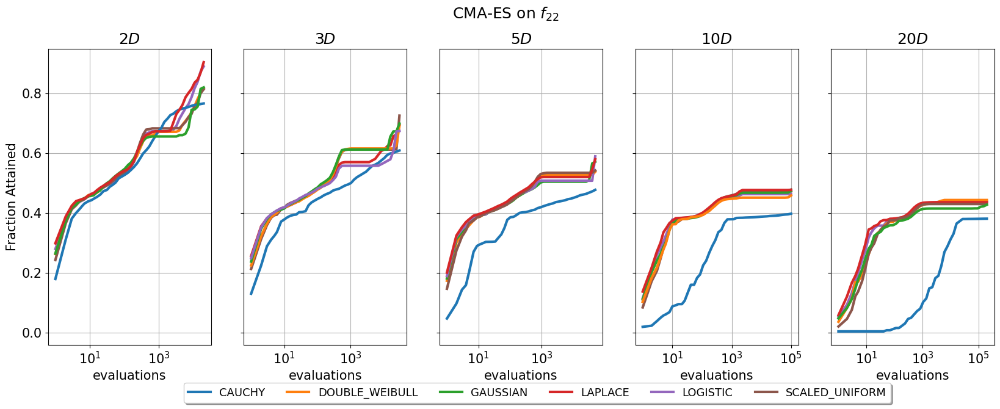

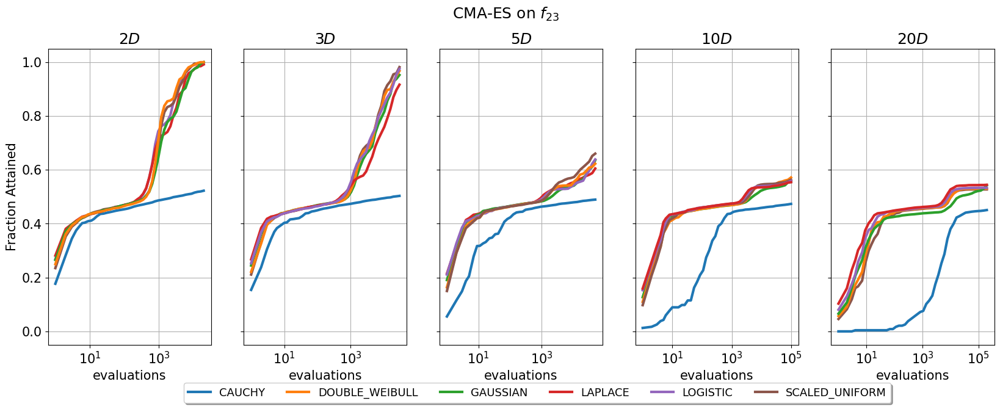

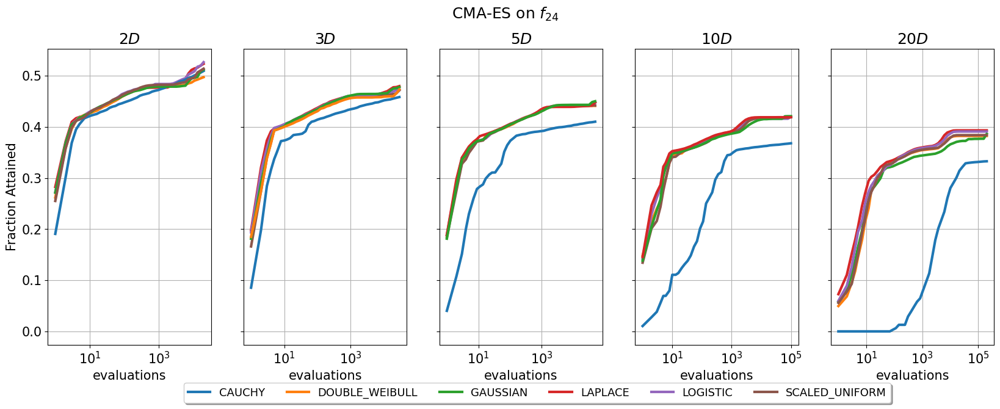

In [9]:
manager = ins.DataManager()

algs = []
for alg in cma_es:
    algs.append(os.path.basename(alg))
    manager.add_folder(alg)
    
algs.sort()
colors = dict(zip(algs, mcolors.TABLEAU_COLORS))

for fid in range(1, 25):
    print(fid, end=',')
    f, axes = plt.subplots(1, 5, figsize=(20, 7), sharey=True)

    f.suptitle(f"CMA-ES on $f_{{{fid}}}$")
    for dim, ax in zip((2, 3, 5, 10, 20), axes.ravel()):
        with warnings.catch_warnings():
            warnings.simplefilter("ignore")
            m = manager.select(function_ids=[fid], dimensions=[dim])
            
        dt = ins.plot.plot_ecdf(m.load(True, True), ax=ax)
        lines = ax.get_lines()[::]
        for line, line_label in zip(lines[:len(lines)//2], lines[len(lines)//2:]):
            if (lab:=line_label.get_label()) in colors:
                for l in (line, line_label):
                    l.set_color(colors[lab])
                    l.set_linewidth(3)  
                    if lab.endswith("128"):
                        l.set_linestyle('dashed')  
                    else:
                        l.set_linestyle('solid')  
                
        handles, labels = ax.get_legend_handles_labels()
        labels = [l[15:] for l in labels[:]]
        idx = np.argsort(labels)
        ax.set_title(f"${dim}D$")
        ax.set_ylabel("Fraction Attained")
        box = ax.get_position()
        ax.set_position([box.x0, box.y0 + box.height * 0.1,
                 box.width, box.height * 0.9])
        
        if dim == 2:
            ax.legend(np.array(handles)[idx], np.array(labels)[idx], loc='upper center',
                fontsize=13, bbox_to_anchor=(3, -0.11), fancybox=True, shadow=True, ncol=len(labels)              
            )
        else:
            ax.legend().remove()
            
    # plt.tight_layout()
    plt.savefig(f"cma_f{fid}.pdf")

1,2,3,4,5,6,7,8,9,10,11,12,13,14,15,16,17,18,19,20,21,

/tmp/ipykernel_2784484/878701631.py:13: RuntimeWarning: More than 20 figures have been opened. Figures created through the pyplot interface (`matplotlib.pyplot.figure`) are retained until explicitly closed and may consume too much memory. (To control this warning, see the rcParam `figure.max_open_warning`). Consider using `matplotlib.pyplot.close()`.
  f, axes = plt.subplots(1, 5, figsize=(20, 7), sharey=True)


22,23,24,

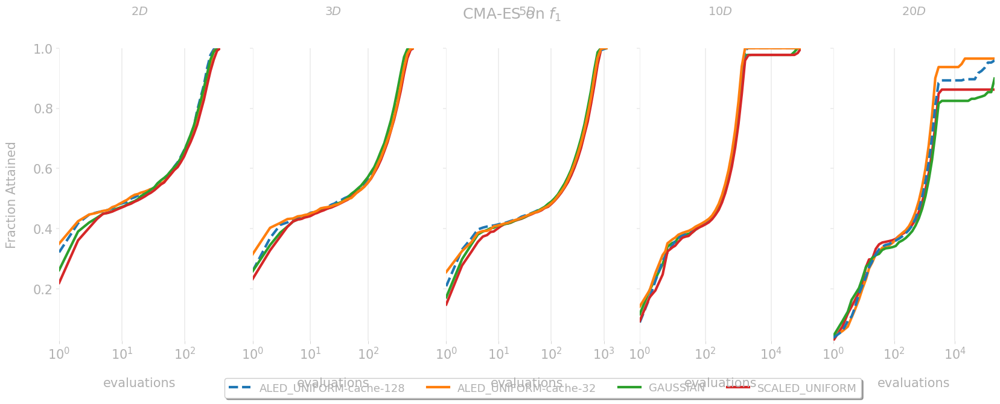

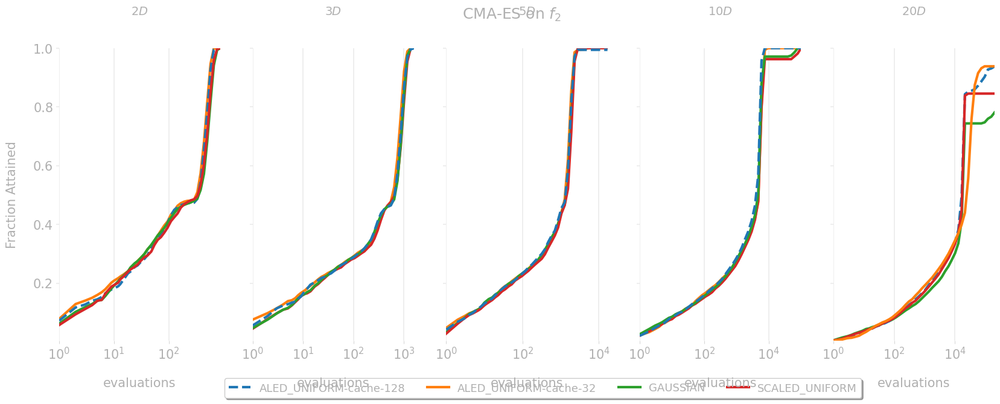

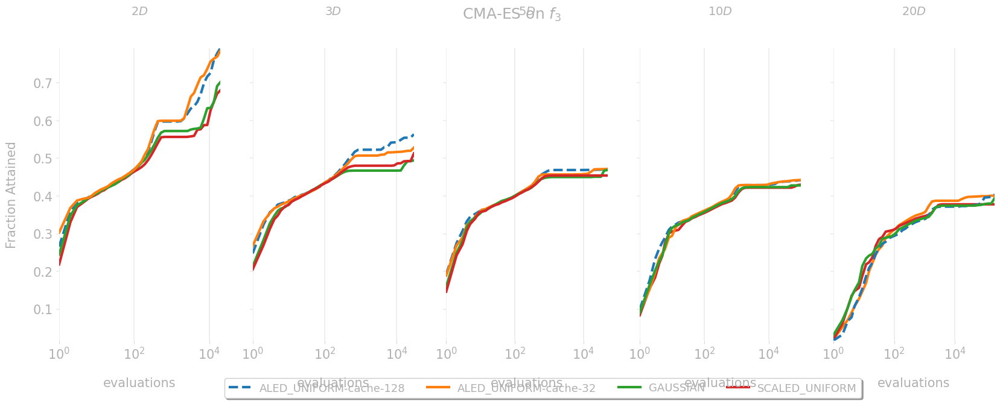

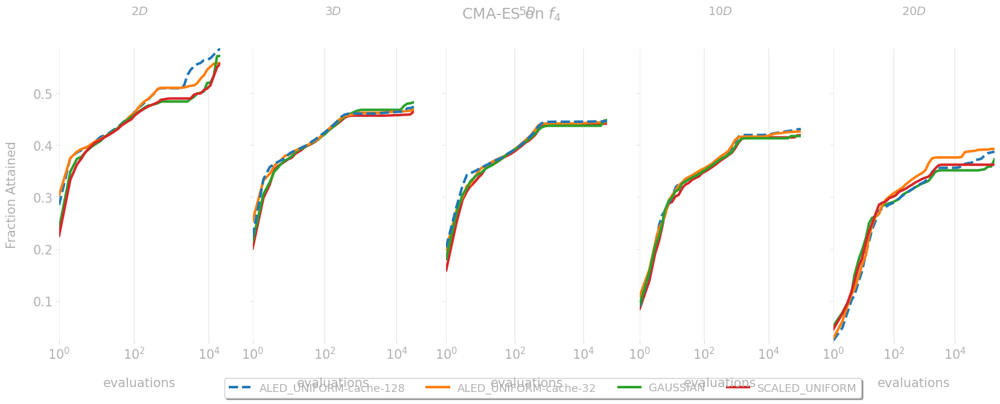

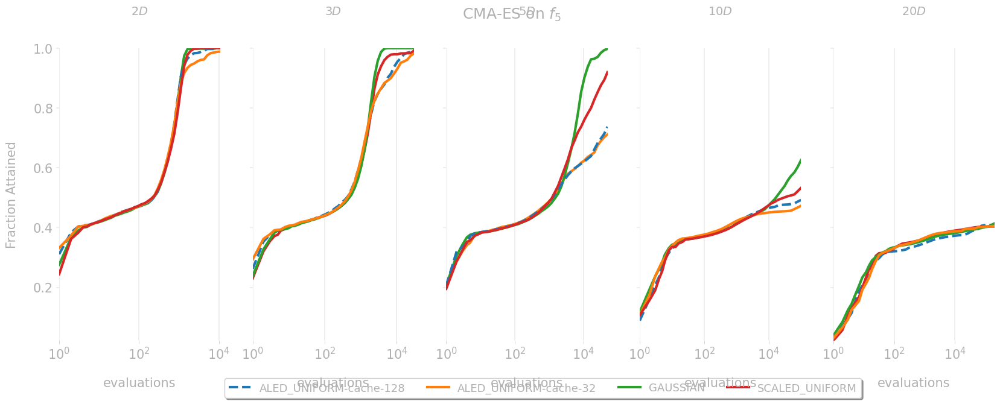

...

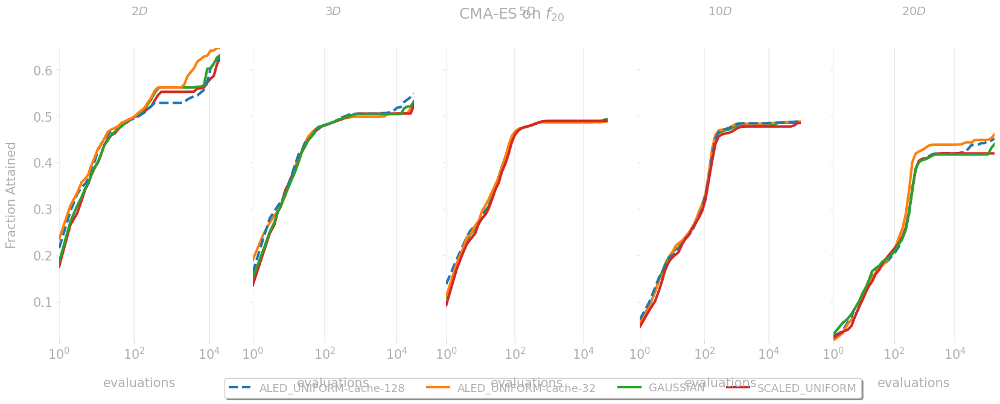

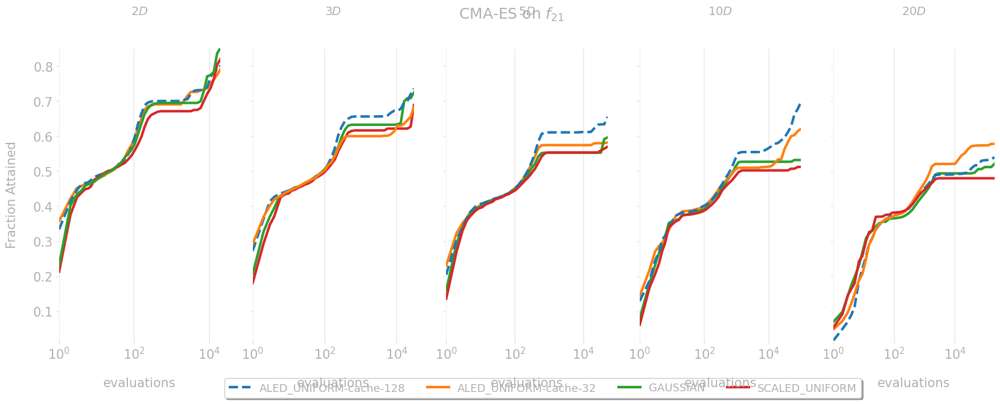

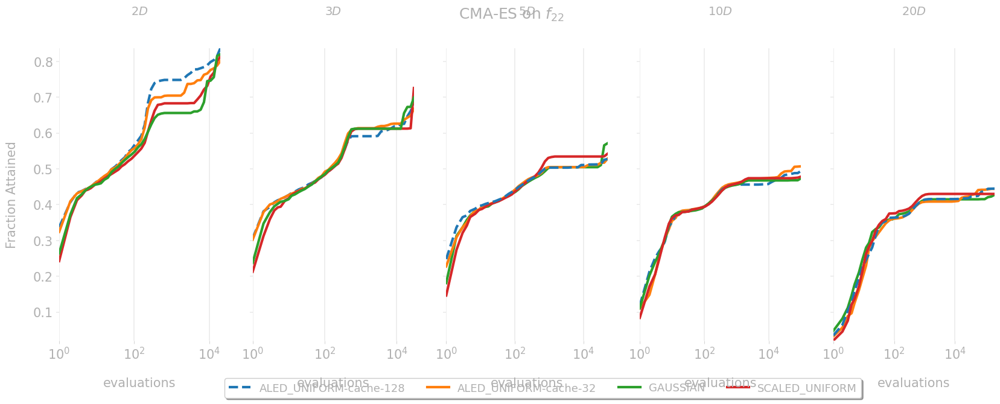

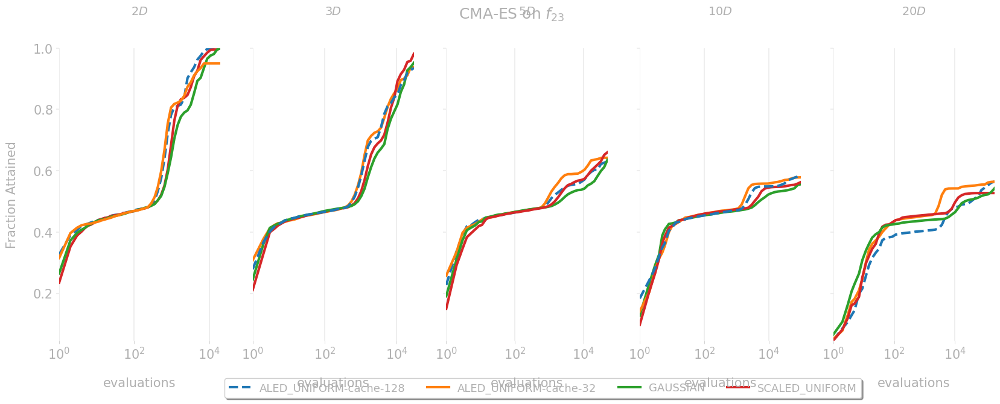

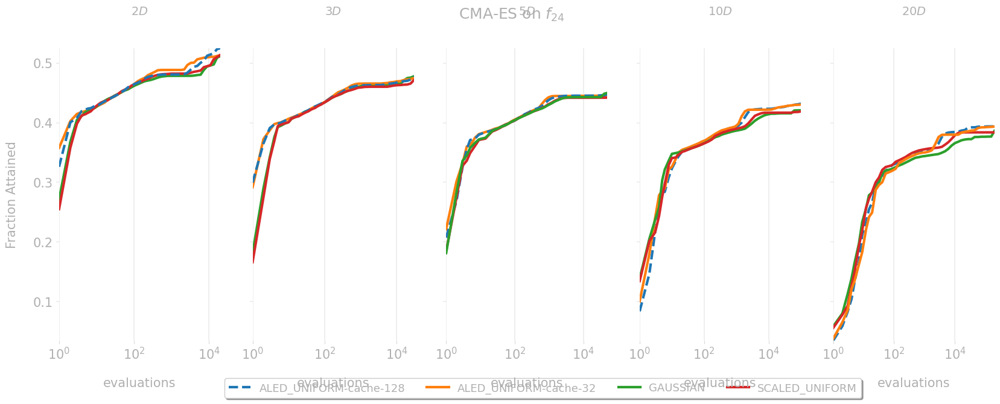

In [98]:
manager = ins.DataManager()

algs = []
for alg in cma_es_sob:
    algs.append(os.path.basename(alg))
    manager.add_folder(alg)
    
algs.sort()
colors = dict(zip(algs, mcolors.TABLEAU_COLORS))

for fid in range(1, 25):
    print(fid, end=',')
    f, axes = plt.subplots(1, 5, figsize=(20, 7), sharey=True)

    f.suptitle(f"CMA-ES on $f_{{{fid}}}$")
    for dim, ax in zip((2, 3, 5, 10, 20), axes.ravel()):
        with warnings.catch_warnings():
            warnings.simplefilter("ignore")
            m = manager.select(function_ids=[fid], dimensions=[dim])
            
        dt = ins.plot.plot_ecdf(m.load(True, True), ax=ax)
        lines = ax.get_lines()[::]
        for line, line_label in zip(lines[:len(lines)//2], lines[len(lines)//2:]):
            if (lab:=line_label.get_label()) in colors:
                for l in (line, line_label):
                    l.set_color(colors[lab])
                    l.set_linewidth(3)  
                    if lab.endswith("128"):
                        l.set_linestyle('dashed')  
                    else:
                        l.set_linestyle('solid')  
                
        handles, labels = ax.get_legend_handles_labels()
        labels = [l[15:] for l in labels[:]]
        idx = np.argsort(labels)
        ax.set_title(f"${dim}D$")
        ax.set_ylabel("Fraction Attained")
        box = ax.get_position()
        ax.set_position([box.x0, box.y0 + box.height * 0.1,
                 box.width, box.height * 0.9])
        
        if dim == 2:
            ax.legend(np.array(handles)[idx], np.array(labels)[idx], loc='upper center',
                fontsize=13, bbox_to_anchor=(3, -0.11), fancybox=True, shadow=True, ncol=len(labels)              
            )
        else:
            ax.legend().remove()
            
    # plt.tight_layout()
    plt.savefig(f"cma_sob_f{fid}.pdf")

In [69]:
import pandas as pd
manager = ins.DataManager()

algs = []
for alg in one_plus_one + mu_comma +cma_es:
    algs.append(os.path.basename(alg))
    manager.add_folder(alg)
    
algs.sort()

def get_aocc(m, xmax, group_cols=["function_name", "algorithm_name"]):
    dt_loaded = m.load(True, True)
    x_values = ins.get_sequence(1, xmax, 50, scale_log=True, cast_to_int=True)
    data_aligned = ins.align_data(dt_loaded.cast({'evaluations': pl.Int64}), evals=x_values)
    data_aocc = ins.transform_fval(data_aligned, fval_col='raw_y', maximization=False)
    return ins.get_aocc(data_aocc, xmax, group_cols=group_cols).group_by(group_cols).agg(pl.col("aocc_contribution").mean().alias("AOCC")).to_pandas()


aoccs = []
for fid in range(1, 25):
    print(fid, end=',')
    for dim, ax in zip((2, 3, 5, 10, 20), axes.ravel()):
        with warnings.catch_warnings():
            warnings.simplefilter("ignore")
            m = manager.select(function_ids=[fid], dimensions=[dim])

        aocc = get_aocc(m, xmax=dim * 10_000)
        aocc['dim'] = dim
        aocc['fid'] = fid
        aocc['sampler'] = aocc['algorithm_name'].str.rsplit('-', n=2, expand=True)[2]
        aocc['algorithm'] = aocc['algorithm_name'].str.rsplit('-', n=2, expand=True)[0]
        aoccs.append(aocc.drop('algorithm_name', axis=1))

aocc = pd.concat(aoccs)

1,2,3,4,5,6,7,8,9,10,11,12,13,14,15,16,17,18,19,20,21,22,23,24,

In [4]:
import pandas as pd
aocc = pd.read_pickle("aocc.pkl")

In [18]:

dats = []
for alg in 'CMA-ES', 'MuCommaLambda', 'OnePlusOne',:
    gdata = aocc[aocc['algorithm'] == alg].copy()
    gdata.loc[:, 'AOCC'] = 1.0 - gdata['AOCC'].copy()
    dats.append(gdata)
    
dats = pd.concat(dats)
ratings = ins.get_glicko2_ratings(pl.DataFrame(dats), alg_vars=['algorithm', 'sampler'], fid_vars=['fid', 'dim'], perf_var='AOCC', nrounds=50)
print(ratings)


        Rating  Deviation      algorithm         sampler
0   788.492456   60.71269         CMA-ES         LAPLACE
1   771.179693  58.817398         CMA-ES        LOGISTIC
2   797.890659  57.539307         CMA-ES  SCALED_UNIFORM
3   818.899039    59.0994         CMA-ES        GAUSSIAN
4   358.120992  47.274725         CMA-ES          CAUCHY
5   823.832633  58.604902         CMA-ES  DOUBLE_WEIBULL
6   337.039054  54.418724  MuCommaLambda          CAUCHY
7   625.258801   44.27384  MuCommaLambda         LAPLACE
8   629.292639  44.236762  MuCommaLambda        GAUSSIAN
9   624.545671  44.346981  MuCommaLambda        LOGISTIC
10  628.296519  44.448611  MuCommaLambda  DOUBLE_WEIBULL
11  612.470589  44.068657  MuCommaLambda  SCALED_UNIFORM
12  489.166488   43.88901     OnePlusOne  SCALED_UNIFORM
13  501.069236   43.80594     OnePlusOne         LAPLACE
14  476.795571  43.720561     OnePlusOne        LOGISTIC
15  493.884089  43.665619     OnePlusOne        GAUSSIAN
16  454.714621  43.706829     O

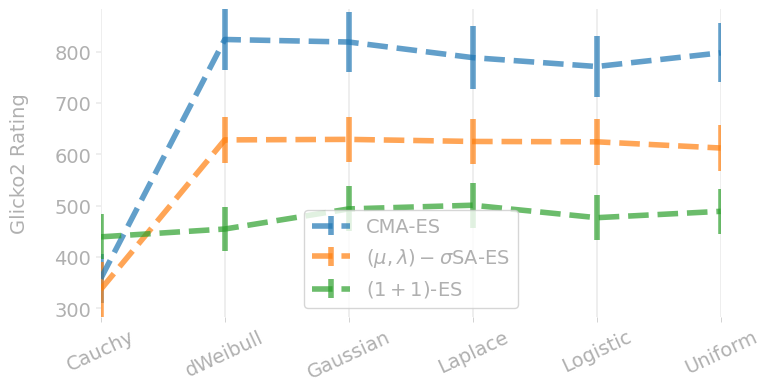

In [60]:
plt.figure(figsize=(8, 4))

nice_labs = {
    "MuCommaLambda": r"$(\mu,\lambda)-\sigma$SA-ES",
    "CMA-ES": "CMA-ES",
    "OnePlusOne": r"$(1+1)$-ES",
}

for alg in 'CMA-ES', 'MuCommaLambda', 'OnePlusOne',:
    rats = ratings[ratings.algorithm == alg]
    idx = np.argsort(rats.sampler)
    plt.errorbar(
        rats.sampler.array[idx], 
        rats.Rating.array[idx], 
        rats.Deviation.array[idx], 
        label=nice_labs[alg], 
        linestyle='dashed', 
        linewidth=4, 
        alpha=.7
    )


plt.xticks(range(len(labels)), labels=[x.title().replace("Double_", "d").replace("Scaled_", "") for x in rats.sampler.array[idx]], rotation=25)
plt.ylabel("Glicko2 Rating")
plt.legend()
plt.grid()




/home/jacob/code/ModularCMAES/venv/lib/python3.10/site-packages/rich/live.py:231: UserWarning: install "ipywidgets"
for Jupyter support
  warnings.warn('install "ipywidgets" for Jupyter support')

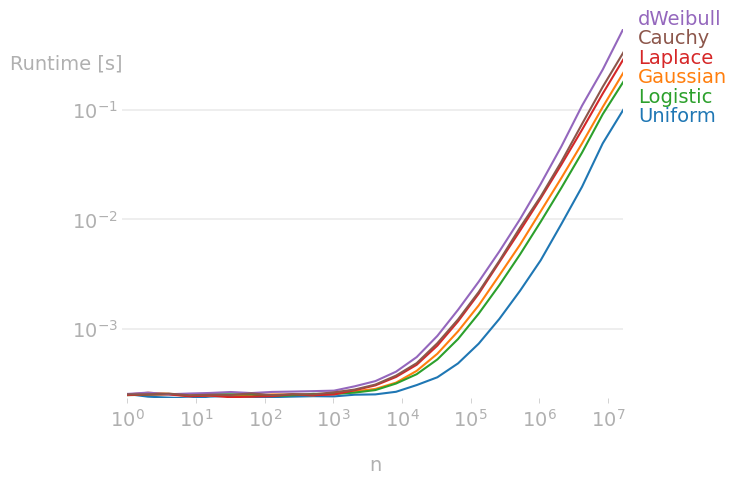

In [ ]:
import perfplot
from scipy import stats


perfplot.show(
    setup=lambda n: n,
    kernels=[
        lambda a: stats.uniform().rvs(size=a),
        lambda a: stats.norm().rvs(size=a),
        lambda a: stats.logistic().rvs(size=a),
        lambda a: stats.laplace().rvs(size=a),
        lambda a: stats.dweibull(2.0, scale=1).rvs(size=a),
        lambda a: stats.cauchy(2.0, scale=1).rvs(size=a),
    ],
    labels=["Uniform", "Gaussian", "Logistic", "Laplace", "dWeibull", "Cauchy"],
    n_range=[2**k for k in range(25)],
    xlabel="n",
    equality_check=None
    # More optional arguments with their default values:
    # logx="auto",  # set to True or False to force scaling
    # logy="auto",
    # equality_check=np.allclose,  # set to None to disable "correctness" assertion
    # show_progress=True,
    # target_time_per_measurement=1.0,
    # max_time=None,  # maximum time per measurement
    # time_unit="s",  # set to one of ("auto", "s", "ms", "us", or "ns") to force plot units
    # relative_to=1,  # plot the timings relative to one of the measurements
    # flops=lambda n: 3*n,  # FLOPS plots
)

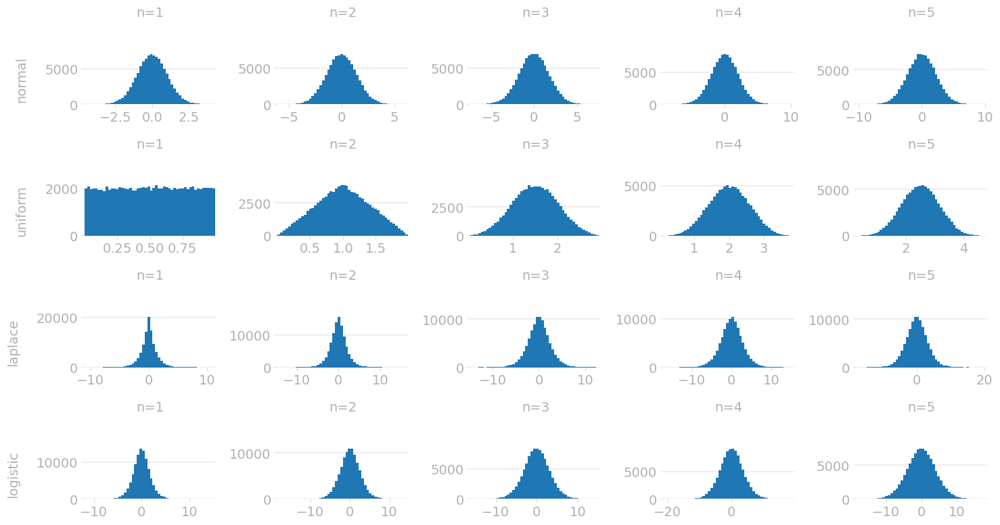

In [91]:
samplers = [
    np.random.normal, 
    np.random.uniform, 
    np.random.laplace, 
    np.random.logistic, 
]
f, axes = plt.subplots(len(samplers), 5, figsize=(15, 2 * len(samplers)))
for sampler, ax in zip(samplers, axes):
    ax[0].set_ylabel(sampler.__name__)
    for n, ax in enumerate(ax, 1):
        ax.hist([np.sum(sampler(size=n)) for _ in range(100_000)], bins=50)
        ax.set_title(f"n={n}")
        
plt.tight_layout()
    

In [72]:
sampler.__name__

'laplace'